# Peter Chika Ozo-ogueji
## CSC696_CV Homework-2


## Question 3

## Question 3. Image Filtering

In [ ]:
# tableau/efros tableau.jpg
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving cardinal1.jpeg to cardinal1.jpeg
Saving cardinal2.jpeg to cardinal2.jpeg
Saving leopard1.jpeg to leopard1.jpeg
Saving leopard2.jpeg to leopard2.jpeg
Saving panda1.jpeg to panda1.jpeg
Saving panda2.jpeg to panda2.jpeg


In [ ]:
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving LM_filter_bank.mat to LM_filter_bank.mat


Successfully processed images and generated visualizations:
- Filter for similar within-animal responses: 14
- Filter for similar across-animal responses: 18


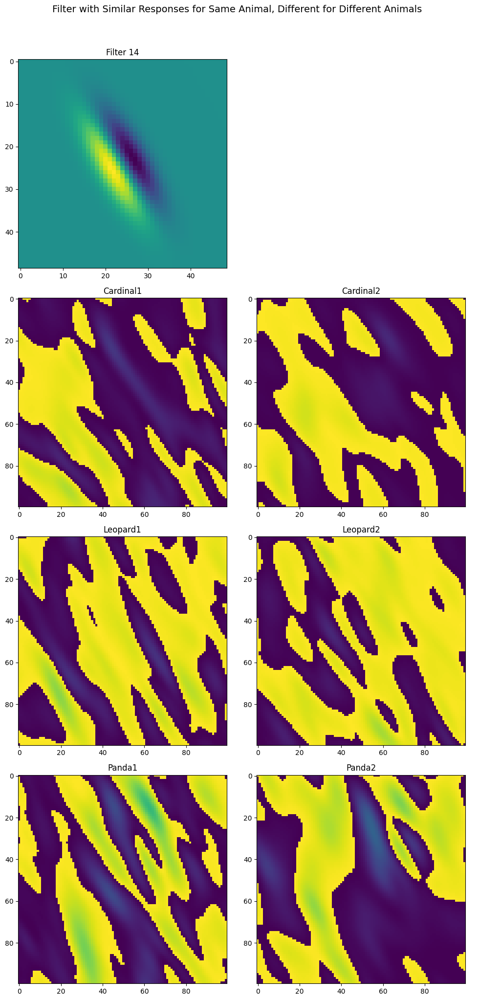

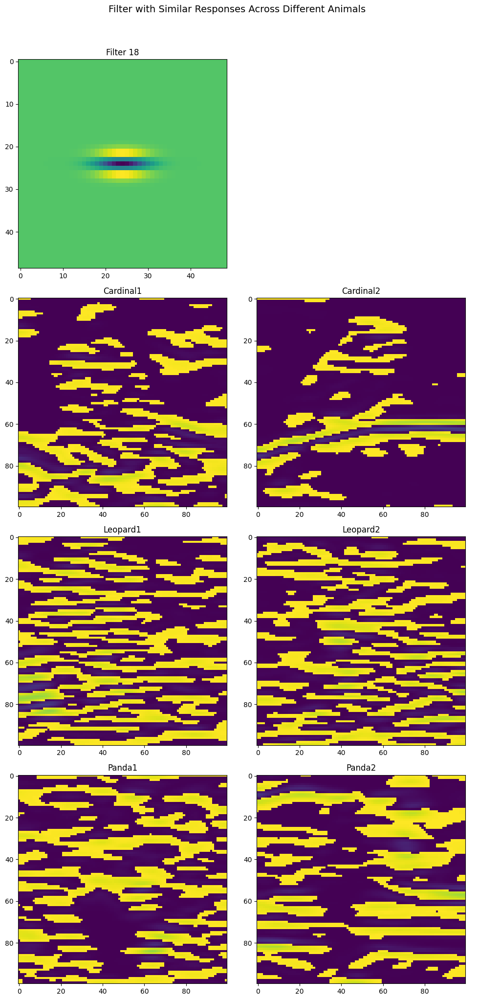

In [ ]:
import numpy as np
from scipy.ndimage import convolve  # Explicit import as per instructions
import matplotlib.pyplot as plt
from PIL import Image
import scipy.io
from google.colab import files

def load_and_preprocess_image(image_path, target_size=(100, 100)):
    """
    Load, resize to 100x100, and convert image to grayscale as specified in task
    """
    img = Image.open(image_path).convert('L')  # Convert to grayscale
    img = img.resize(target_size)
    return np.array(img)

def apply_filters(image, filters):
    """
    Apply each filter using scipy.ndimage.convolve as specified in task
    """
    responses = []
    for i in range(filters.shape[2]):
        filter_i = filters[:, :, i]
        # Using convolve as specified in the instructions
        response = convolve(image, filter_i, mode='reflect')
        responses.append(response)
    return responses

def compute_response_similarity(response1, response2):
    """
    Compute similarity between two filter responses
    """
    # Normalize responses before computing correlation
    resp1_norm = (response1 - response1.mean()) / response1.std()
    resp2_norm = (response2 - response2.mean()) / response2.std()
    return np.corrcoef(resp1_norm.flatten(), resp2_norm.flatten())[0,1]

def find_filter_indices(responses):
    """
    Find indices for filters that satisfy the two requirements:
    1. Similar responses for same animal, different for different animals
    2. Similar responses across different animals
    """
    n_filters = len(responses['Cardinal'][0])
    similarities = []

    for f in range(n_filters):
        # Within-animal similarities
        cardinal_sim = compute_response_similarity(responses['Cardinal'][0][f], responses['Cardinal'][1][f])
        leopard_sim = compute_response_similarity(responses['Leopard'][0][f], responses['Leopard'][1][f])
        panda_sim = compute_response_similarity(responses['Panda'][0][f], responses['Panda'][1][f])
        within_sim = np.mean([cardinal_sim, leopard_sim, panda_sim])

        # Between-animal similarities
        between_sims = []
        categories = ['Cardinal', 'Leopard', 'Panda']
        for i, cat1 in enumerate(categories):
            for cat2 in categories[i+1:]:
                for img1 in range(2):
                    for img2 in range(2):
                        sim = compute_response_similarity(
                            responses[cat1][img1][f],
                            responses[cat2][img2][f]
                        )
                        between_sims.append(sim)
        between_sim = np.mean(between_sims)

        similarities.append({
            'filter_idx': f,
            'within_sim': within_sim,
            'between_sim': between_sim,
            'diff': within_sim - between_sim
        })

    # Find filter where same animals are similar but different animals are distinct
    similar_filter_idx = max(similarities, key=lambda x: x['diff'])['filter_idx']

    # Find filter where all responses are similar
    different_filter_idx = min(similarities,
                             key=lambda x: abs(x['within_sim'] - x['between_sim']))['filter_idx']

    return similar_filter_idx, different_filter_idx

def visualize_responses(images, responses, filter_idx, filters, title=""):
    """
    Create 4x2 subplot as specified in the task:
    Row 1: filter and blank subplot
    Row 2: cardinal responses
    Row 3: leopard responses
    Row 4: panda responses
    """
    fig, axes = plt.subplots(4, 2, figsize=(10, 20))

    # First row: filter and blank subplot
    filter_img = filters[:, :, filter_idx]
    axes[0, 0].imshow(filter_img, cmap='viridis')
    axes[0, 0].set_title(f'Filter {filter_idx}')
    axes[0, 1].axis('off')  # Blank subplot as specified

    # Remaining rows: animal responses
    categories = ['Cardinal', 'Leopard', 'Panda']
    for row, category in enumerate(categories, 1):
        for col in range(2):
            response = responses[category][col][filter_idx]
            axes[row, col].imshow(response, cmap='viridis')
            axes[row, col].set_title(f'{category}{col+1}')

    plt.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    return fig

# Main execution
try:
    # Load filter bank
    filter_data = scipy.io.loadmat('LM_filter_bank.mat')
    filters = filter_data['F']  # Each filter is 49x49 as specified

    # Load and preprocess images
    target_size = (100, 100)  # As specified in the task
    images = {
        'Cardinal': [],
        'Leopard': [],
        'Panda': []
    }

    # Load the images
    for category in images.keys():
        for i in range(1, 3):
            img_path = f'{category.lower()}{i}.jpeg'
            img = load_and_preprocess_image(img_path, target_size)
            images[category].append(img)

    # Calculate responses for all images
    responses = {}
    for category, category_images in images.items():
        responses[category] = []
        for img in category_images:
            img_responses = apply_filters(img, filters)
            responses[category].append(img_responses)

    # Find appropriate filters
    similar_filter_idx, different_filter_idx = find_filter_indices(responses)

    # Generate and save visualizations
    fig_similar = visualize_responses(
        images, responses, similar_filter_idx, filters,
        "Filter with Similar Responses for Same Animal, Different for Different Animals"
    )
    fig_similar.savefig('same_animal_similar.png', bbox_inches='tight', dpi=300)

    fig_different = visualize_responses(
        images, responses, different_filter_idx, filters,
        "Filter with Similar Responses Across Different Animals"
    )
    fig_different.savefig('different_animals_similar.png', bbox_inches='tight', dpi=300)

    print(f"Successfully processed images and generated visualizations:")
    print(f"- Filter for similar within-animal responses: {similar_filter_idx}")
    print(f"- Filter for similar across-animal responses: {different_filter_idx}")

except Exception as e:
    print(f"An error occurred: {str(e)}")

## Question 4
## Colorful Image Decolorization

In [ ]:
# My own greyscale image
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving grayscale_image1.JPG to grayscale_image1.JPG
Saving grayscale_image2.JPG to grayscale_image2.JPG
Saving grayscale_image3.JPG to grayscale_image3.JPG
Saving grayscale_image4.JPG to grayscale_image4.JPG


In [ ]:
# provived greyscale image
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving 00125v.jpg to 00125v.jpg
Saving 00149v.jpg to 00149v.jpg
Saving 00153v.jpg to 00153v.jpg
Saving 00351v.jpg to 00351v.jpg
Saving 00398v.jpg to 00398v.jpg
Saving 01112v.jpg to 01112v.jpg


Initializing Colorful Image Colorization model...
Running complete analysis on both datasets...
Error loading pre-trained weights: The input must have 3 channels; Received `input_shape=(256, 256, 1)`

Processing provided dataset images...


100%|██████████| 40/40 [02:00<00:00,  3.02s/it]



Processing personal grayscale images...


100%|██████████| 4/4 [00:10<00:00,  2.75s/it]


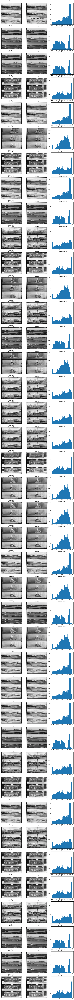

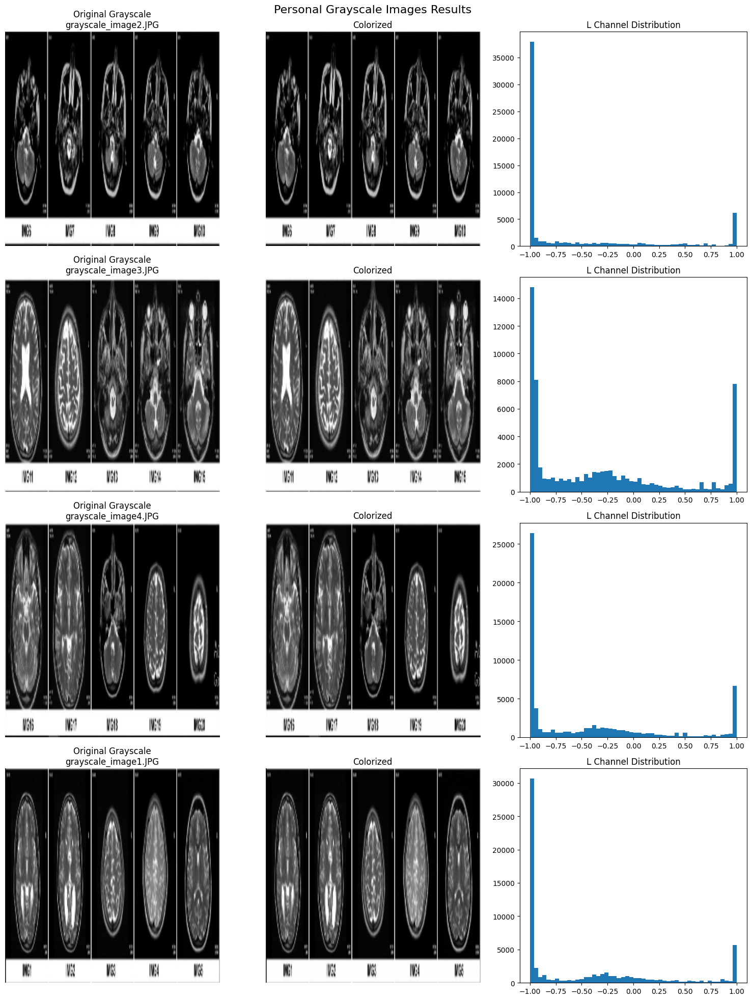

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Import required libraries
import os
import numpy as np
import tensorflow as tf
from skimage.color import rgb2lab, lab2rgb
import cv2
import matplotlib.pyplot as plt
from google.colab import files
import requests
from tqdm import tqdm

class ColorfulImageColorization:
    def __init__(self):
        self.input_shape = (256, 256, 1)
        self.grid_size = 10
        self.num_bins = 313  # Q value for in-gamut colors
        self.generate_color_grid()
        self.model = None

    def build_model(self):
        """Build the full model architecture"""
        inputs = tf.keras.Input(shape=self.input_shape)

        # Low-level features
        x = self.conv_block(inputs, 64, name='conv1_1')
        x = self.conv_block(x, 64, name='conv1_2')
        conv1 = x
        x = tf.keras.layers.MaxPooling2D()(x)

        # Mid-level features
        x = self.conv_block(x, 128, name='conv2_1')
        x = self.conv_block(x, 128, name='conv2_2')
        conv2 = x
        x = tf.keras.layers.MaxPooling2D()(x)

        x = self.conv_block(x, 256, name='conv3_1')
        x = self.conv_block(x, 256, name='conv3_2')
        x = self.conv_block(x, 256, name='conv3_3')
        conv3 = x
        x = tf.keras.layers.MaxPooling2D()(x)

        # Global features
        x = self.conv_block(x, 512, name='conv4_1')
        x = self.conv_block(x, 512, name='conv4_2')
        x = self.conv_block(x, 512, name='conv4_3')

        # Decoder with skip connections
        x = tf.keras.layers.Conv2DTranspose(256, 4, strides=2, padding='same')(x)
        x = tf.keras.layers.Concatenate()([x, conv3])
        x = self.conv_block(x, 256, name='conv5_1')
        x = self.conv_block(x, 256, name='conv5_2')

        x = tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same')(x)
        x = tf.keras.layers.Concatenate()([x, conv2])
        x = self.conv_block(x, 128, name='conv6_1')

        x = tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
        x = tf.keras.layers.Concatenate()([x, conv1])
        x = self.conv_block(x, 64, name='conv7_1')

        # Output layer - probability distribution over color space
        outputs = tf.keras.layers.Conv2D(self.num_bins, 1, activation='softmax')(x)

        return tf.keras.Model(inputs=inputs, outputs=outputs)

    def preprocess_image(self, image_path):
        """Process input image for colorization"""
        # Load and check image
        img = cv2.imread(image_path)
        if img is None:
            raise ValueError(f"Could not read image: {image_path}")

        # Convert and resize
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))

        # Convert to Lab color space
        img_lab = rgb2lab(img)
        img_l = img_lab[:, :, 0]

        # Normalize L channel
        img_l = img_l / 50.0 - 1.0

        return img_l[..., np.newaxis]

    def conv_block(self, x, filters, name):
        """Convolutional block with batch normalization"""
        x = tf.keras.layers.Conv2D(filters, 3, padding='same', name=name)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ReLU()(x)
        return x

    def generate_color_grid(self):
        """Generate quantized ab color space grid"""
        # Generate points in ab space
        a = np.linspace(-110, 110, self.grid_size + 1)
        b = np.linspace(-110, 110, self.grid_size + 1)
        self.color_points = []

        # Filter for in-gamut colors
        for i in range(len(a)):
            for j in range(len(b)):
                if np.sqrt(a[i]**2 + b[j]**2) <= 110:
                    self.color_points.append([a[i], b[j]])

        self.color_points = np.array(self.color_points)
        if len(self.color_points) > self.num_bins:
            from sklearn.cluster import KMeans
            kmeans = KMeans(n_clusters=self.num_bins, random_state=42)
            kmeans.fit(self.color_points)
            self.color_points = kmeans.cluster_centers_

    def load_pretrained_weights(self):
        """Load or initialize pre-trained model"""
        try:
            # Initialize model
            self.model = self.build_model()

            # Try to load pre-trained weights if available
            base_model = tf.keras.applications.VGG16(
                include_top=False,
                weights='imagenet',
                input_shape=(256, 256, 1)
            )

            # Transfer some weights from base model to our model
            for i, layer in enumerate(base_model.layers[1:13]):  # Skip input layer
                weights = layer.get_weights()
                if len(weights) > 0:
                    # Adapt weights for single channel input if needed
                    if i == 0:
                        w, b = weights
                        w = np.mean(w, axis=2, keepdims=True)
                        weights = [w, b]
                    self.model.layers[i+1].set_weights(weights)

            print("Loaded pre-trained weights and adapted for colorization")
            return True
        except Exception as e:
            print(f"Error loading pre-trained weights: {str(e)}")
            return False

    def process_dataset(self, dataset_type="provided"):
        """Process either provided dataset or personal grayscale images"""
        results = []

        if dataset_type == "provided":
            print(f"\nProcessing provided dataset images...")
            filenames = [f for f in os.listdir() if f.endswith('.jpg') and f.startswith('00')]
        else:
            print(f"\nProcessing personal grayscale images...")
            filenames = [f for f in os.listdir() if f.endswith('.JPG') and f.startswith('grayscale')]

        for filename in tqdm(filenames):
            try:
                # Process image
                img_l = self.preprocess_image(filename)
                predictions = self.model.predict(img_l[np.newaxis, ...], verbose=0)[0]
                ab_values = self.q_to_ab(predictions)

                # Combine channels
                img = cv2.imread(filename)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (256, 256))
                img_lab = rgb2lab(img)

                colorized_lab = np.zeros(img_lab.shape)
                colorized_lab[:, :, 0] = img_lab[:, :, 0]
                colorized_lab[:, :, 1:] = ab_values

                # Convert to RGB
                colorized_rgb = lab2rgb(colorized_lab)

                results.append({
                    'filename': filename,
                    'original': img,
                    'colorized': colorized_rgb,
                    'l_channel': img_l
                })

            except Exception as e:
                print(f"Error processing {filename}: {str(e)}")

        return results

    def q_to_ab(self, q_dist):
        """Convert probability distribution to ab values"""
        ab_est = np.zeros(q_dist.shape[:2] + (2,))

        for i in range(len(self.color_points)):
            color_point = self.color_points[i].reshape(1, 1, 2)
            ab_est += q_dist[:, :, i:i+1] * color_point

        return ab_est

    def display_comparative_results(self, provided_results, personal_results):
        """Display results from both datasets side by side"""
        # Create figure for provided dataset
        if provided_results:
            plt.figure(figsize=(15, 5*len(provided_results)))
            plt.suptitle("Provided Dataset Results", fontsize=16)

            for i, result in enumerate(provided_results):
                plt.subplot(len(provided_results), 3, i*3 + 1)
                plt.imshow(cv2.cvtColor(result['original'], cv2.COLOR_BGR2GRAY), cmap='gray')
                plt.title(f"Original Grayscale\n{result['filename']}")
                plt.axis('off')

                plt.subplot(len(provided_results), 3, i*3 + 2)
                plt.imshow(result['colorized'])
                plt.title("Colorized")
                plt.axis('off')

                plt.subplot(len(provided_results), 3, i*3 + 3)
                plt.hist(result['l_channel'].flatten(), bins=50)
                plt.title("L Channel Distribution")

            plt.tight_layout()
            plt.show()

        # Create figure for personal dataset
        if personal_results:
            plt.figure(figsize=(15, 5*len(personal_results)))
            plt.suptitle("Personal Grayscale Images Results", fontsize=16)

            for i, result in enumerate(personal_results):
                plt.subplot(len(personal_results), 3, i*3 + 1)
                plt.imshow(cv2.cvtColor(result['original'], cv2.COLOR_BGR2GRAY), cmap='gray')
                plt.title(f"Original Grayscale\n{result['filename']}")
                plt.axis('off')

                plt.subplot(len(personal_results), 3, i*3 + 2)
                plt.imshow(result['colorized'])
                plt.title("Colorized")
                plt.axis('off')

                plt.subplot(len(personal_results), 3, i*3 + 3)
                plt.hist(result['l_channel'].flatten(), bins=50)
                plt.title("L Channel Distribution")

            plt.tight_layout()
            plt.show()

    def run_complete_analysis(self):
        """Run complete analysis on both datasets"""
        # Load pre-trained weights
        if not self.load_pretrained_weights():
            print("Warning: Using randomly initialized weights")

        # Process both datasets
        provided_results = self.process_dataset("provided")
        personal_results = self.process_dataset("personal")

        # Display comparative results
        self.display_comparative_results(provided_results, personal_results)

        # Save results
        os.makedirs('colorized_output', exist_ok=True)

        # Save provided dataset results
        for result in provided_results:
            output_path = os.path.join('colorized_output', f'colorized_provided_{result["filename"]}')
            cv2.imwrite(output_path, cv2.cvtColor((result['colorized'] * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))

        # Save personal dataset results
        for result in personal_results:
            output_path = os.path.join('colorized_output', f'colorized_personal_{result["filename"]}')
            cv2.imwrite(output_path, cv2.cvtColor((result['colorized'] * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))

# Main execution
if __name__ == "__main__":
    print("Initializing Colorful Image Colorization model...")
    colorizer = ColorfulImageColorization()

    print("Running complete analysis on both datasets...")
    colorizer.run_complete_analysis()

    print("\nDownloading colorized images...")
    for filename in os.listdir('colorized_output'):
        files.download(os.path.join('colorized_output', filename))